# 02 — CLIP Zero-Shot Baseline + Error AnalysisEvaluates pretrained CLIP ViT-B/32 and ViT-B/16 on Flickr30k Karpathy test split, then analyses where the baseline fails. Output of this notebook (baseline embeddings, JSON metrics, failure categorisation) motivates the fine-tuning experiments in notebook 03.

## 1. Setup

In [ ]:
import sys
from pathlib import Path

PROJECT_ROOT = Path.cwd().parent
if str(PROJECT_ROOT) not in sys.path:
    sys.path.insert(0, str(PROJECT_ROOT))

from src.config import get_device, set_seeds

set_seeds(42)
device = get_device()
print(f"Device: {device}")

In [ ]:
import gc
import time
from collections import Counter, defaultdict

import matplotlib.pyplot as plt
import numpy as np
import torch

from src.clip_embeddings import (
    encode_images,
    encode_texts,
    extract_and_cache_images,
    extract_and_cache_texts,
    load_clip_model,
    load_embeddings,
    save_embeddings,
)
from src.config import EMBEDDINGS_DIR, MODELS_DIR, RESULTS_DIR
from src.data import (
    get_all_captions_flat,
    get_captions,
    get_image,
    load_karpathy_splits,
)
from src.evaluation import (
    evaluate_text_to_image,
    load_results,
    print_results_table,
    recall_at_k,
    save_results,
)
from src.retrieval import get_ranks, get_similarity_scores, text_to_image_search
from src.visualize import (
    plot_error_analysis_grid,
    plot_rank_distribution,
    plot_recall_comparison,
    plot_retrieval_results,
    plot_similarity_distribution,
    plot_text_image_similarity_distribution,
    plot_training_curves,
    plot_tsne,
)

splits = load_karpathy_splits()
test_captions, gt_indices = get_all_captions_flat(splits["test"])
captions, test_gt = test_captions, gt_indices
test_ds = splits["test"]
print(f"Test images: {len(splits['test'])}  |  Test captions: {len(test_captions)}")

## 2. Embedding extraction (B/32 and B/16)

In [5]:
img_emb_b32 = extract_and_cache_images(splits["test"], "clip-vit-b-32", split="test")
print(f"Image embeddings shape: {img_emb_b32.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:07,  1.90it/s]

Encoding images:  12%|█▎        | 2/16 [00:00<00:05,  2.64it/s]

Encoding images:  19%|█▉        | 3/16 [00:01<00:04,  3.09it/s]

Encoding images:  25%|██▌       | 4/16 [00:01<00:03,  3.39it/s]

Encoding images:  31%|███▏      | 5/16 [00:01<00:03,  3.59it/s]

Encoding images:  38%|███▊      | 6/16 [00:01<00:02,  3.72it/s]

Encoding images:  44%|████▍     | 7/16 [00:02<00:02,  3.78it/s]

Encoding images:  50%|█████     | 8/16 [00:02<00:02,  3.83it/s]

Encoding images:  56%|█████▋    | 9/16 [00:02<00:01,  3.85it/s]

Encoding images:  62%|██████▎   | 10/16 [00:02<00:01,  3.89it/s]

Encoding images:  69%|██████▉   | 11/16 [00:03<00:01,  3.96it/s]

Encoding images:  75%|███████▌  | 12/16 [00:03<00:00,  4.02it/s]

Encoding images:  81%|████████▏ | 13/16 [00:03<00:00,  4.06it/s]

Encoding images:  88%|████████▊ | 14/16 [00:03<00:00,  4.03it/s]

Encoding images:  94%|█████████▍| 15/16 [00:04<00:00,  4.07it/s]

Encoding images: 100%|██████████| 16/16 [00:04<00:00,  4.44it/s]

Encoding images: 100%|██████████| 16/16 [00:04<00:00,  3.79it/s]

Saved (1000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_images_test.npy
Image embeddings shape: (1000, 512)


In [6]:
txt_emb_b32 = extract_and_cache_texts(test_captions, "clip-vit-b-32", split="test")
print(f"Text embeddings shape: {txt_emb_b32.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch32
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:   1%|▏         | 1/79 [00:00<00:37,  2.09it/s]

Encoding texts:   4%|▍         | 3/79 [00:00<00:13,  5.78it/s]

Encoding texts:   6%|▋         | 5/79 [00:00<00:08,  8.71it/s]

Encoding texts:   9%|▉         | 7/79 [00:00<00:06, 10.74it/s]

Encoding texts:  13%|█▎        | 10/79 [00:00<00:04, 14.16it/s]

Encoding texts:  16%|█▋        | 13/79 [00:01<00:03, 16.99it/s]

Encoding texts:  19%|█▉        | 15/79 [00:01<00:03, 17.56it/s]

Encoding texts:  23%|██▎       | 18/79 [00:01<00:03, 20.00it/s]

Encoding texts:  27%|██▋       | 21/79 [00:01<00:02, 20.39it/s]

Encoding texts:  30%|███       | 24/79 [00:01<00:02, 19.75it/s]

Encoding texts:  34%|███▍      | 27/79 [00:01<00:02, 18.22it/s]

Encoding texts:  37%|███▋      | 29/79 [00:01<00:02, 17.69it/s]

Encoding texts:  41%|████      | 32/79 [00:02<00:02, 19.44it/s]

Encoding texts:  44%|████▍     | 35/79 [00:02<00:02, 20.93it/s]

Encoding texts:  48%|████▊     | 38/79 [00:02<00:01, 21.95it/s]

Encoding texts:  52%|█████▏    | 41/79 [00:02<00:01, 22.18it/s]

Encoding texts:  56%|█████▌    | 44/79 [00:02<00:01, 21.95it/s]

Encoding texts:  59%|█████▉    | 47/79 [00:02<00:01, 22.69it/s]

Encoding texts:  63%|██████▎   | 50/79 [00:02<00:01, 23.44it/s]

Encoding texts:  67%|██████▋   | 53/79 [00:02<00:01, 21.71it/s]

Encoding texts:  71%|███████   | 56/79 [00:03<00:01, 21.21it/s]

Encoding texts:  75%|███████▍  | 59/79 [00:03<00:00, 22.68it/s]

Encoding texts:  78%|███████▊  | 62/79 [00:03<00:00, 18.51it/s]

Encoding texts:  82%|████████▏ | 65/79 [00:03<00:00, 19.95it/s]

Encoding texts:  86%|████████▌ | 68/79 [00:03<00:00, 17.84it/s]

Encoding texts:  89%|████████▊ | 70/79 [00:03<00:00, 17.48it/s]

Encoding texts:  91%|█████████ | 72/79 [00:04<00:00, 17.09it/s]

Encoding texts:  95%|█████████▍| 75/79 [00:04<00:00, 17.61it/s]

Encoding texts:  99%|█████████▊| 78/79 [00:04<00:00, 17.85it/s]

Encoding texts: 100%|██████████| 79/79 [00:04<00:00, 17.05it/s]

Saved (5000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-32_texts_test.npy
Text embeddings shape: (5000, 512)


In [10]:
img_emb_b16 = extract_and_cache_images(splits["test"], "clip-vit-b-16", split="test")
print(f"Image embeddings shape: {img_emb_b16.shape}")

model.safetensors:   0%|          | 0.00/599M [00:00<?, ?B/s]

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding images:   0%|          | 0/16 [00:00<?, ?it/s]

Encoding images:   6%|▋         | 1/16 [00:00<00:11,  1.33it/s]

Encoding images:  12%|█▎        | 2/16 [00:01<00:09,  1.46it/s]

Encoding images:  19%|█▉        | 3/16 [00:02<00:08,  1.54it/s]

Encoding images:  25%|██▌       | 4/16 [00:02<00:07,  1.56it/s]

Encoding images:  31%|███▏      | 5/16 [00:03<00:07,  1.57it/s]

Encoding images:  38%|███▊      | 6/16 [00:03<00:06,  1.57it/s]

Encoding images:  44%|████▍     | 7/16 [00:04<00:05,  1.57it/s]

Encoding images:  50%|█████     | 8/16 [00:05<00:05,  1.58it/s]

Encoding images:  56%|█████▋    | 9/16 [00:05<00:04,  1.59it/s]

Encoding images:  62%|██████▎   | 10/16 [00:06<00:03,  1.61it/s]

Encoding images:  69%|██████▉   | 11/16 [00:07<00:03,  1.59it/s]

Encoding images:  75%|███████▌  | 12/16 [00:07<00:02,  1.57it/s]

Encoding images:  81%|████████▏ | 13/16 [00:08<00:01,  1.58it/s]

Encoding images:  88%|████████▊ | 14/16 [00:08<00:01,  1.58it/s]

Encoding images:  94%|█████████▍| 15/16 [00:09<00:00,  1.59it/s]

Encoding images: 100%|██████████| 16/16 [00:09<00:00,  1.78it/s]

Encoding images: 100%|██████████| 16/16 [00:09<00:00,  1.61it/s]

Saved (1000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-16_images_test.npy
Image embeddings shape: (1000, 512)


In [11]:
txt_emb_b16 = extract_and_cache_texts(test_captions, "clip-vit-b-16", split="test")
print(f"Text embeddings shape: {txt_emb_b16.shape}")

Loading weights:   0%|          | 0/398 [00:00<?, ?it/s]

CLIPModel LOAD REPORT from: openai/clip-vit-base-patch16
Key                                  | Status     |  | 
-------------------------------------+------------+--+-
text_model.embeddings.position_ids   | UNEXPECTED |  | 
vision_model.embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED:	can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Encoding texts:   0%|          | 0/79 [00:00<?, ?it/s]

Encoding texts:   1%|▏         | 1/79 [00:00<00:16,  4.59it/s]

Encoding texts:   5%|▌         | 4/79 [00:00<00:05, 12.51it/s]

Encoding texts:   8%|▊         | 6/79 [00:00<00:04, 14.67it/s]

Encoding texts:  11%|█▏        | 9/79 [00:00<00:03, 17.92it/s]

Encoding texts:  15%|█▌        | 12/79 [00:00<00:03, 19.22it/s]

Encoding texts:  19%|█▉        | 15/79 [00:00<00:03, 20.84it/s]

Encoding texts:  23%|██▎       | 18/79 [00:00<00:02, 22.25it/s]

Encoding texts:  27%|██▋       | 21/79 [00:01<00:02, 22.23it/s]

Encoding texts:  30%|███       | 24/79 [00:01<00:02, 23.50it/s]

Encoding texts:  34%|███▍      | 27/79 [00:01<00:02, 21.53it/s]

Encoding texts:  38%|███▊      | 30/79 [00:01<00:02, 20.70it/s]

Encoding texts:  42%|████▏     | 33/79 [00:01<00:02, 21.63it/s]

Encoding texts:  46%|████▌     | 36/79 [00:01<00:01, 22.66it/s]

Encoding texts:  49%|████▉     | 39/79 [00:01<00:01, 23.55it/s]

Encoding texts:  53%|█████▎    | 42/79 [00:02<00:01, 23.14it/s]

Encoding texts:  57%|█████▋    | 45/79 [00:02<00:01, 23.18it/s]

Encoding texts:  61%|██████    | 48/79 [00:02<00:01, 23.06it/s]

Encoding texts:  65%|██████▍   | 51/79 [00:02<00:01, 23.47it/s]

Encoding texts:  68%|██████▊   | 54/79 [00:02<00:01, 22.10it/s]

Encoding texts:  72%|███████▏  | 57/79 [00:02<00:00, 22.61it/s]

Encoding texts:  76%|███████▌  | 60/79 [00:02<00:00, 22.77it/s]

Encoding texts:  80%|███████▉  | 63/79 [00:03<00:00, 20.45it/s]

Encoding texts:  84%|████████▎ | 66/79 [00:03<00:00, 21.12it/s]

Encoding texts:  87%|████████▋ | 69/79 [00:03<00:00, 18.35it/s]

Encoding texts:  91%|█████████ | 72/79 [00:03<00:00, 18.37it/s]

Encoding texts:  95%|█████████▍| 75/79 [00:03<00:00, 18.33it/s]

Encoding texts:  99%|█████████▊| 78/79 [00:03<00:00, 18.65it/s]

Encoding texts: 100%|██████████| 79/79 [00:03<00:00, 20.11it/s]

Saved (5000, 512) to /Users/andrejvysny/fiit/nsiete/NSIETE_2026/Project2/data/embeddings/clip-vit-b-16_texts_test.npy
Text embeddings shape: (5000, 512)


## 3. Zero-shot evaluation

In [ ]:
results_b32 = evaluate_text_to_image(txt_emb_b32, img_emb_b32, gt_indices)
results_b16 = evaluate_text_to_image(txt_emb_b16, img_emb_b16, gt_indices)

all_results = {"clip-vit-b-32": results_b32, "clip-vit-b-16": results_b16}
print_results_table(all_results, title="CLIP zero-shot — Flickr30k test")

save_results(results_b32, "baseline_b32")
save_results(results_b16, "baseline_b16")

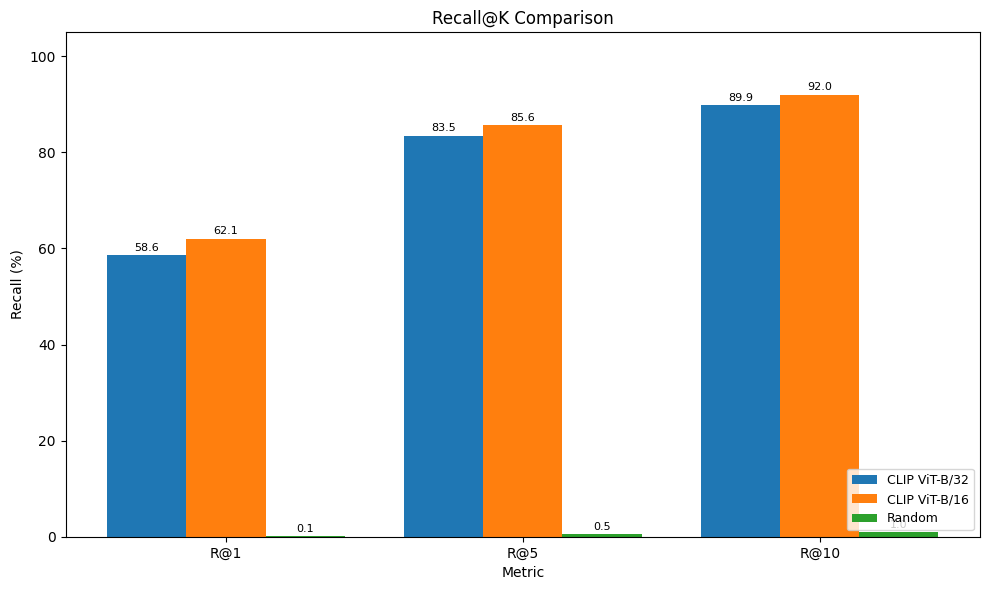

In [17]:
fig = plot_recall_comparison(all_results)
plt.show()

## 4. Rank distributions

In [ ]:
ranks_b32 = get_ranks(txt_emb_b32, img_emb_b32, gt_indices)
ranks_b16 = get_ranks(txt_emb_b16, img_emb_b16, gt_indices)

plot_rank_distribution(ranks_b32, title="Rank Distribution: CLIP ViT-B/32")
plot_rank_distribution(ranks_b16, title="Rank Distribution: CLIP ViT-B/16")

## 5. Qualitative — best & worst cases

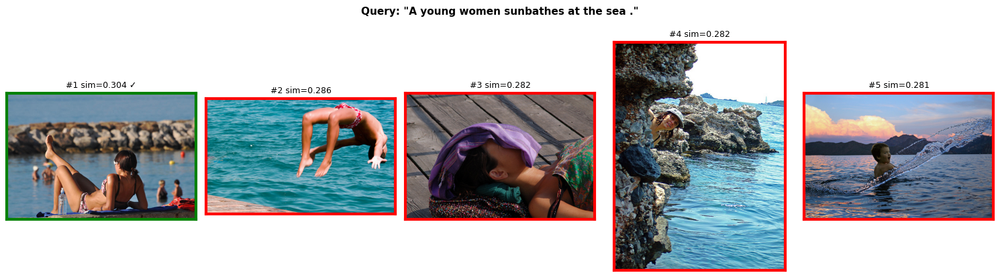

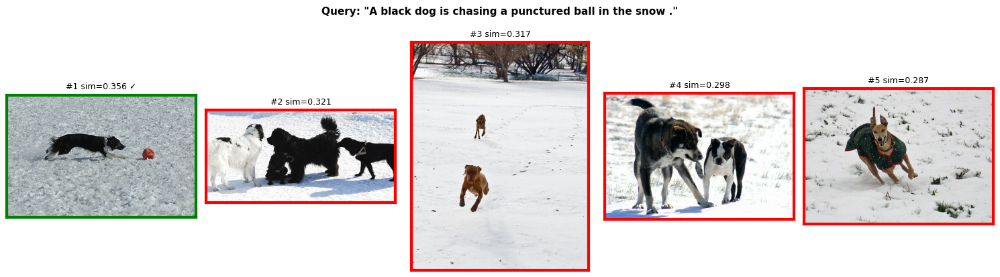

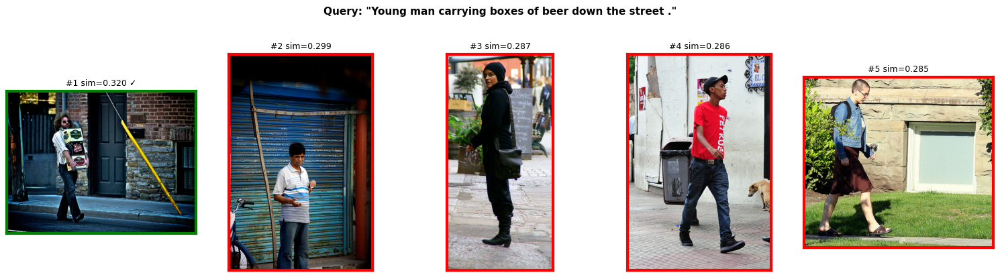

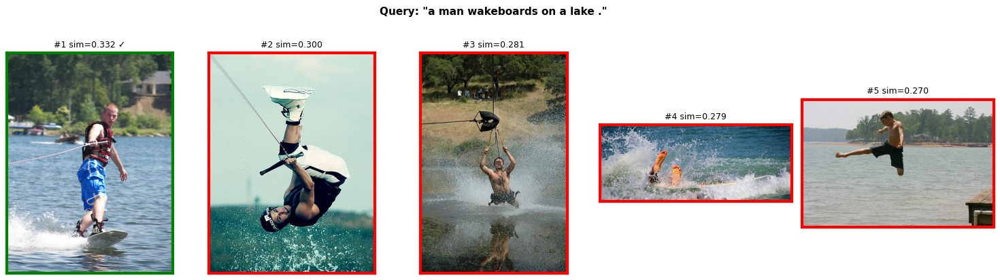

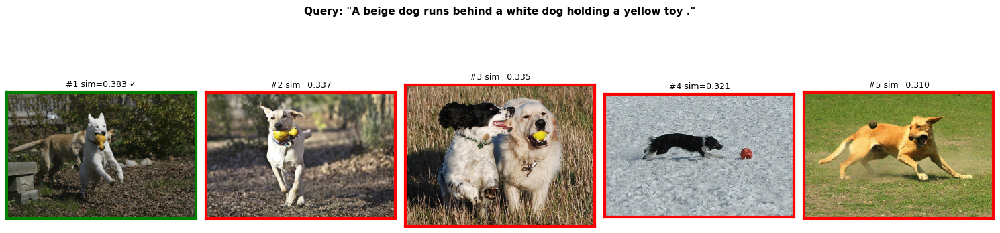

In [20]:
# Best cases: rank = 0
best_indices = np.where(ranks_b32 == 0)[0]
rng = np.random.default_rng(42)
best_sample = rng.choice(best_indices, size=min(5, len(best_indices)), replace=False)

for idx in best_sample:
    caption = test_captions[idx]
    results = text_to_image_search(txt_emb_b32[idx], img_emb_b32, top_k=5)
    fig = plot_retrieval_results(
        caption, results, splits["test"],
        ground_truth_idx=gt_indices[idx],
    )
    plt.show()

Rank: 507 | Caption: A young girl plays as a woman talks on phone .


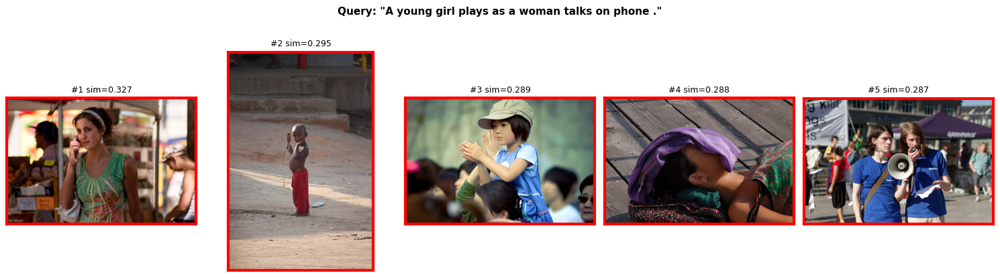

Rank: 429 | Caption: This man and women lost something and is looking for it .


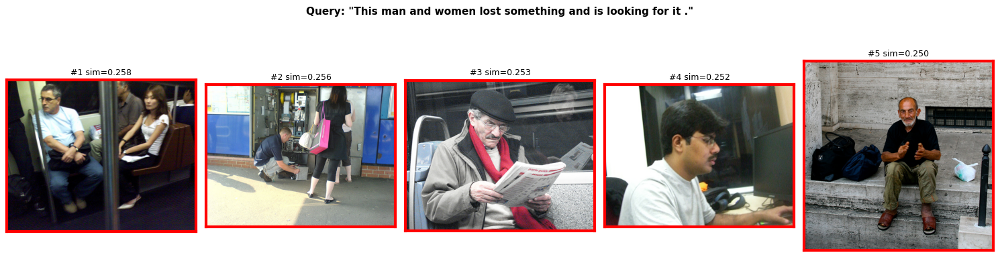

Rank: 385 | Caption: A woman and three children .


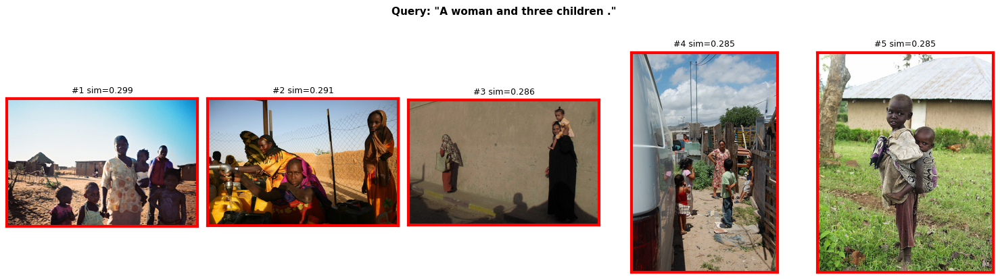

Rank: 374 | Caption: A man is drinking out of a yellow cup .


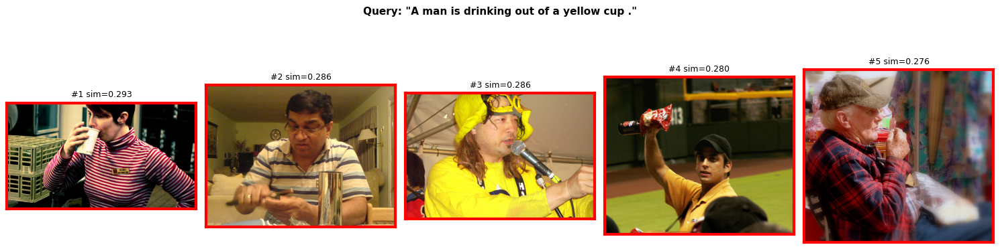

Rank: 360 | Caption: Have a quick chat and smoke break .


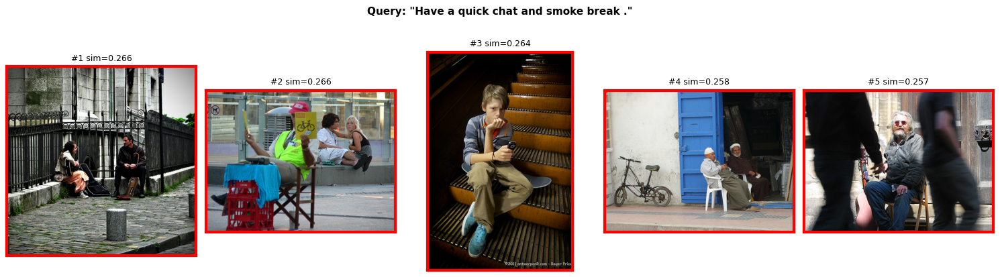

In [21]:
# Worst cases: highest rank
worst_order = np.argsort(ranks_b32)[::-1]
worst_sample = worst_order[:5]

for idx in worst_sample:
    caption = test_captions[idx]
    print(f"Rank: {ranks_b32[idx]} | Caption: {caption[:80]}")
    results = text_to_image_search(txt_emb_b32[idx], img_emb_b32, top_k=5)
    fig = plot_retrieval_results(
        caption, results, splits["test"],
        ground_truth_idx=gt_indices[idx],
    )
    plt.show()

## 6. Embedding-space visualisation

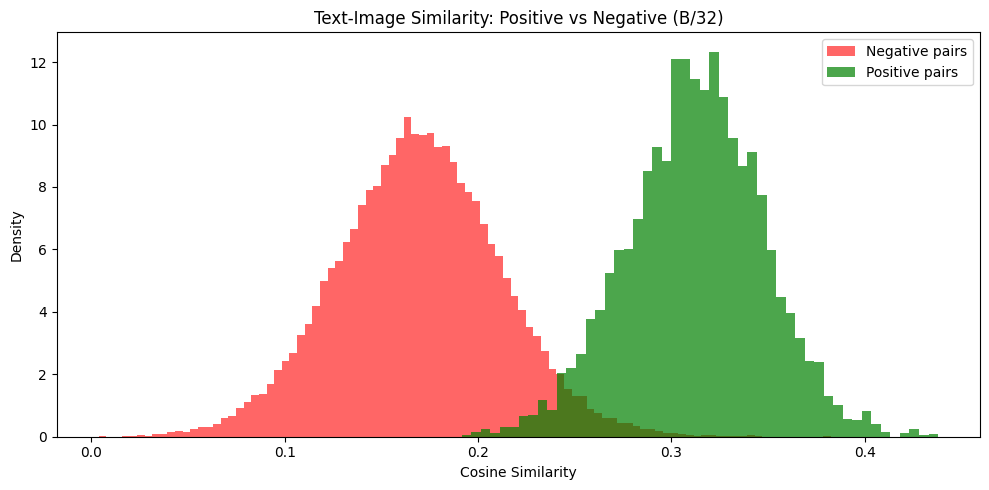

In [26]:
fig = plot_text_image_similarity_distribution(
    txt_emb_b32, img_emb_b32, gt_indices,
    title="Text-Image Similarity: Positive vs Negative (B/32)",
)
plt.show()

Running t-SNE on 1000 points...


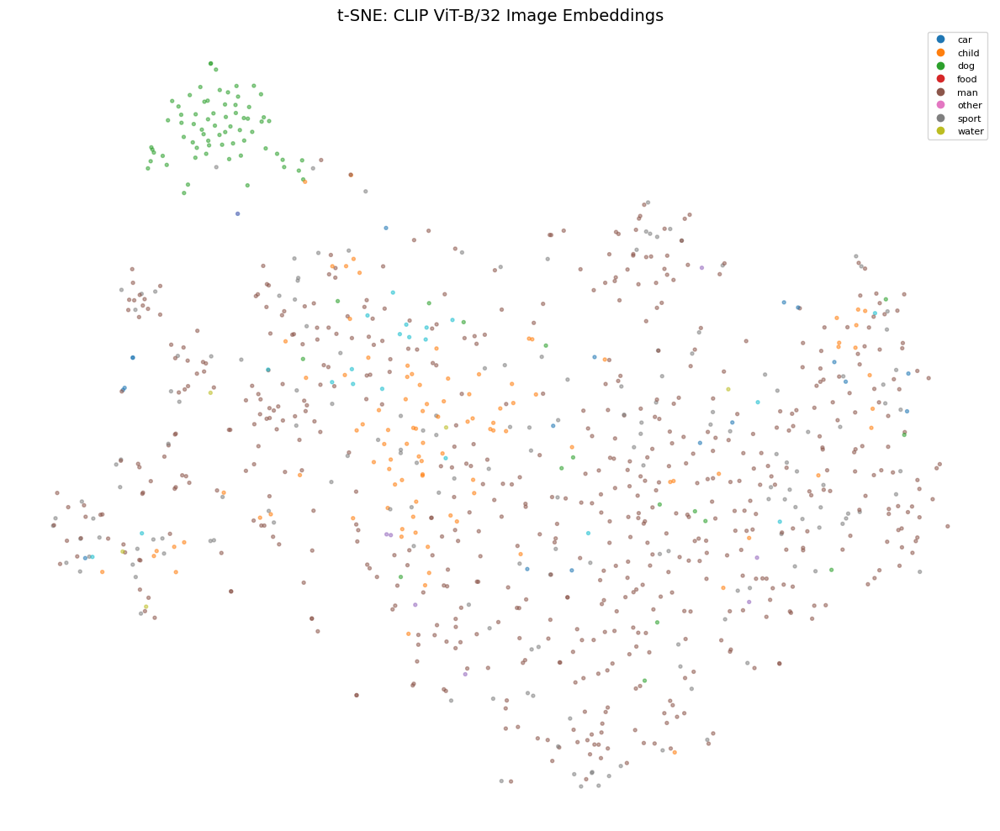

In [27]:
fig = plot_tsne(
    img_emb_b32, splits["test"],
    title="t-SNE: CLIP ViT-B/32 Image Embeddings",
    sample_size=1000,
)
plt.show()

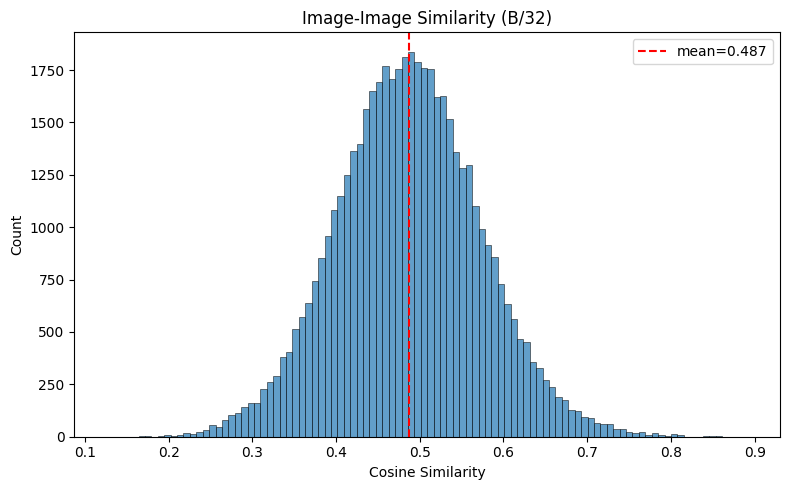

In [28]:
fig = plot_similarity_distribution(
    img_emb_b32,
    title="Image-Image Similarity (B/32)",
)
plt.show()

## 7. Error analysis — failure categorisationFailures are captions whose ground-truth image is not at rank 0. We bucket them by linguistic pattern (counting / spatial / colour / action / attribute) to see where CLIP zero-shot loses signal.

In [8]:
# Near-miss / mid-range / far-miss breakdown
n_total = len(ranks_b32)

for name, ranks in [("B/32", ranks_b32), ("B/16", ranks_b16)]:
    exact = (ranks == 0).sum()
    near_miss = ((ranks >= 1) & (ranks <= 5)).sum()
    mid_range = ((ranks > 5) & (ranks <= 50)).sum()
    far_miss = (ranks > 50).sum()

    print(f"\n{name} breakdown:")
    print(f"  Exact match (rank 0):   {exact:5d} ({exact / n_total * 100:5.1f}%)")
    print(f"  Near-miss (rank 1-5):   {near_miss:5d} ({near_miss / n_total * 100:5.1f}%)")
    print(f"  Mid-range (rank 6-50):  {mid_range:5d} ({mid_range / n_total * 100:5.1f}%)")
    print(f"  Far-miss  (rank 50+):   {far_miss:5d} ({far_miss / n_total * 100:5.1f}%)")


B/32 breakdown:
  Exact match (rank 0):    2929 ( 58.6%)
  Near-miss (rank 1-5):    1338 ( 26.8%)
  Mid-range (rank 6-50):    623 ( 12.5%)
  Far-miss  (rank 50+):     110 (  2.2%)

B/16 breakdown:
  Exact match (rank 0):    3103 ( 62.1%)
  Near-miss (rank 1-5):    1279 ( 25.6%)
  Mid-range (rank 6-50):    542 ( 10.8%)
  Far-miss  (rank 50+):      76 (  1.5%)


In [9]:
# Failure = GT not at rank 0
failure_mask = ranks_b32 > 0
failure_indices = np.where(failure_mask)[0]

print(f"Total queries: {n_total}")
print(f"Failures (rank > 0): {len(failure_indices)} ({len(failure_indices) / n_total * 100:.1f}%)")
print(f"Successes (rank == 0): {n_total - len(failure_indices)}")

Total queries: 5000
Failures (rank > 0): 2071 (41.4%)
Successes (rank == 0): 2929


In [10]:
# Collect failure cases with top-1 retrieved image
failure_cases = []

for i in failure_indices:
    top1 = text_to_image_search(txt_emb_b32[i], img_emb_b32, top_k=1)
    top1_idx = top1[0][0]

    failure_cases.append({
        "query_idx": int(i),
        "query_text": captions[i],
        "gt_idx": int(gt_indices[i]),
        "gt_rank": int(ranks_b32[i]),
        "retrieved_idx": int(top1_idx),
    })

print(f"Collected {len(failure_cases)} failure cases")
print("\nSample failure:")
print(f"  Query: '{failure_cases[0]['query_text']}'")
print(f"  GT rank: {failure_cases[0]['gt_rank']}")
print(f"  GT image idx: {failure_cases[0]['gt_idx']}")
print(f"  Retrieved idx: {failure_cases[0]['retrieved_idx']}")

Collected 2071 failure cases

Sample failure:
  Query: 'The man with pierced ears is wearing glasses and an orange hat .'
  GT rank: 2
  GT image idx: 0
  Retrieved idx: 164


In [11]:
# Heuristic category definitions
CATEGORY_KEYWORDS = {
    "counting": ["two", "three", "four", "five", "six", "seven", "group", "several", "many", "couple", "pair"],
    "spatial": ["left", "right", "behind", "front", "between", "next to", "above", "below", "beside"],
    "color": ["red", "blue", "green", "yellow", "white", "black", "pink", "brown", "orange", "purple", "gray", "grey"],
    "action": ["running", "jumping", "sitting", "standing", "walking", "playing", "riding", "holding", "eating", "throwing", "climbing"],
    "attribute": ["young", "old", "small", "large", "tall", "wearing", "little", "big", "short"],
}


def categorize_caption(text: str) -> str:
    """Assign first matching category, or 'other'."""
    text_lower = text.lower()
    for category, keywords in CATEGORY_KEYWORDS.items():
        for kw in keywords:
            if kw in text_lower:
                return category
    return "other"


# Categorize all failures
for case in failure_cases:
    case["category"] = categorize_caption(case["query_text"])

category_counts = Counter(case["category"] for case in failure_cases)
print("Failure count by category:")
for cat, count in category_counts.most_common():
    print(f"  {cat:>12}: {count:5d} ({count / len(failure_cases) * 100:5.1f}%)")

Failure count by category:
      counting:   591 ( 28.5%)
         other:   475 ( 22.9%)
         color:   459 ( 22.2%)
        action:   288 ( 13.9%)
       spatial:   134 (  6.5%)
     attribute:   124 (  6.0%)


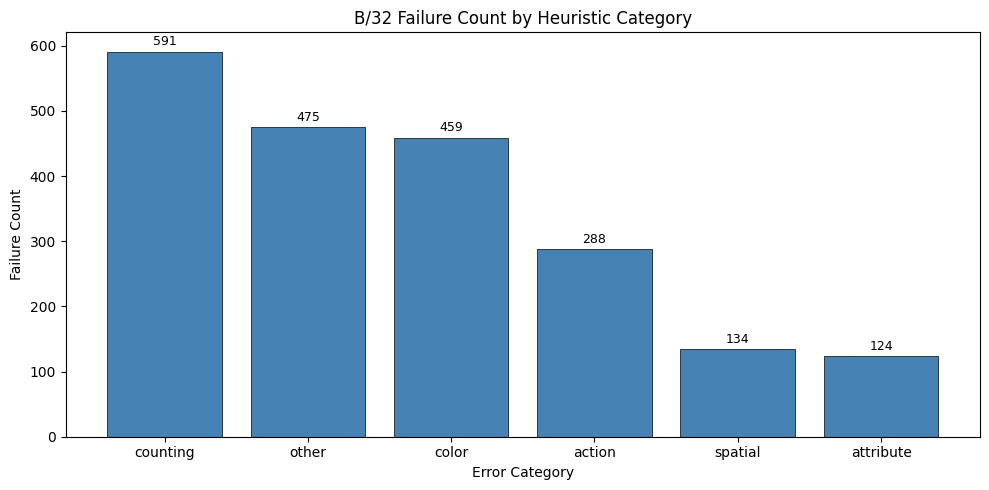

In [12]:
# Bar chart of failure counts by category
cats_sorted = [c for c, _ in category_counts.most_common()]
counts_sorted = [category_counts[c] for c in cats_sorted]

fig, ax = plt.subplots(figsize=(10, 5))
bars = ax.bar(cats_sorted, counts_sorted, color="steelblue", edgecolor="black", linewidth=0.5)
for bar, count in zip(bars, counts_sorted):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height() + 5,
            str(count), ha="center", va="bottom", fontsize=9)
ax.set_xlabel("Error Category")
ax.set_ylabel("Failure Count")
ax.set_title("B/32 Failure Count by Heuristic Category")
fig.tight_layout()
plt.show()

In [13]:
# Mean rank per category
category_ranks = defaultdict(list)
for case in failure_cases:
    category_ranks[case["category"]].append(case["gt_rank"])

print("Mean rank per error category:")
print(f"{'Category':>12} {'Mean Rank':>10} {'Median Rank':>12} {'Count':>8}")
print("-" * 44)
for cat in cats_sorted:
    ranks_cat = np.array(category_ranks[cat])
    print(f"{cat:>12} {ranks_cat.mean():>10.1f} {np.median(ranks_cat):>12.1f} {len(ranks_cat):>8d}")

Mean rank per error category:
    Category  Mean Rank  Median Rank    Count
--------------------------------------------
    counting       12.5          3.0      591
       other       12.5          3.0      475
       color       12.5          3.0      459
      action       10.0          3.0      288
     spatial       12.5          3.0      134
   attribute       13.5          3.0      124



--- Category: counting (591 failures) ---
  rank= 385  'A woman and three children .'
  rank= 324  'A group of people are sitting in chairs .'
  rank= 203  'Two boys playing ball in the street .'


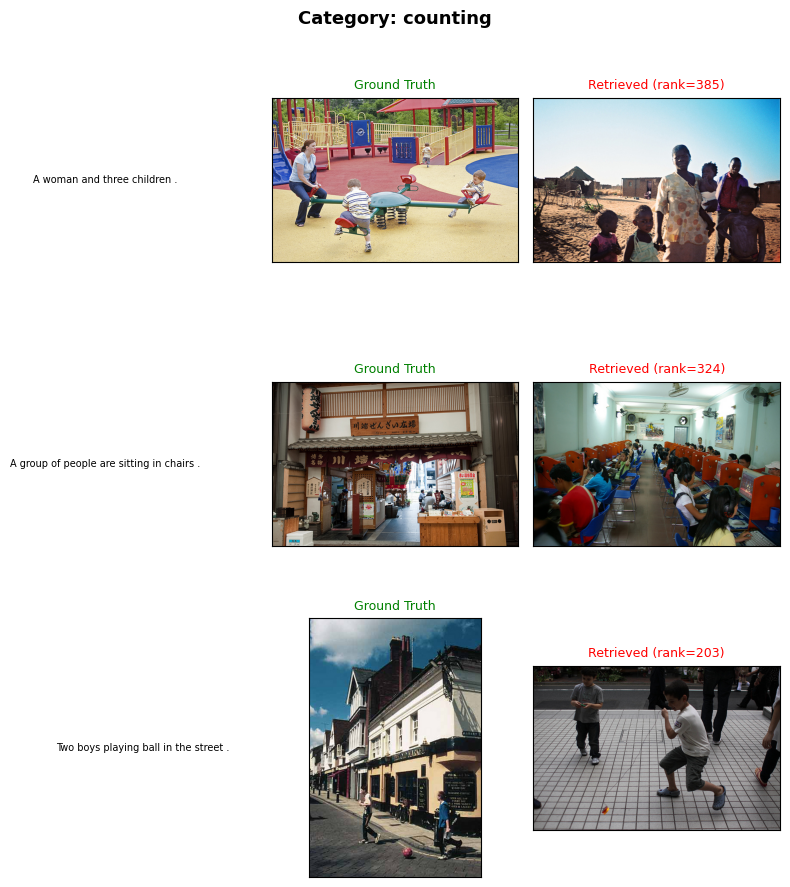


--- Category: other (475 failures) ---
  rank= 429  'This man and women lost something and is looking for it .'
  rank= 360  'Have a quick chat and smoke break .'
  rank= 233  'We have to go there to look into the machine .'


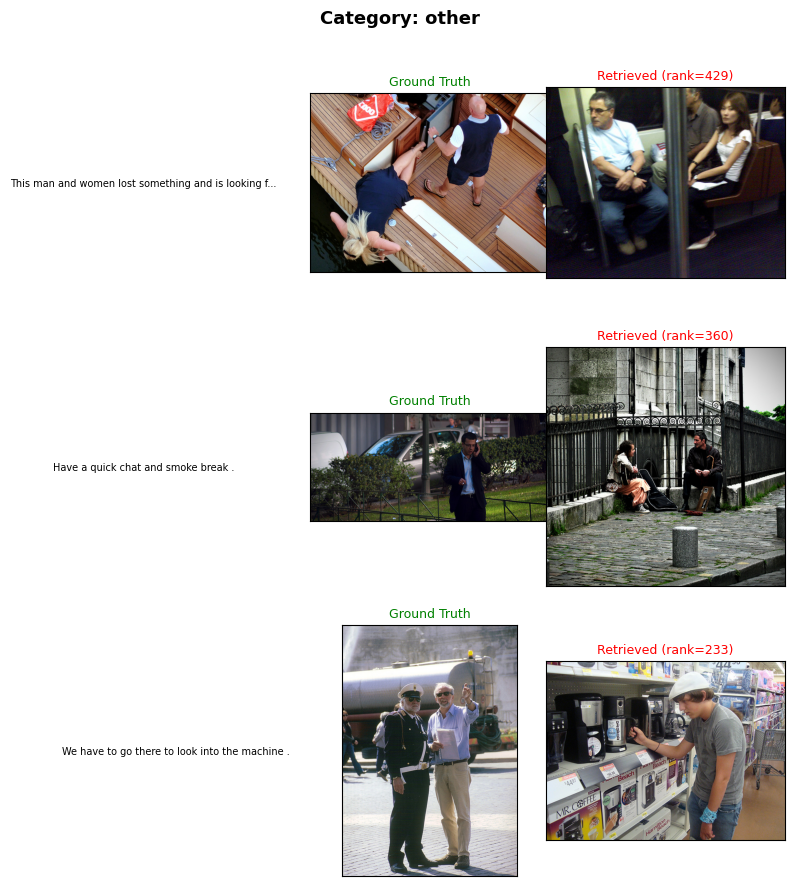


--- Category: color (459 failures) ---
  rank= 374  'A man is drinking out of a yellow cup .'
  rank= 295  'Blond man crossing street  in white shirt and red t-shirt  carrying a ...'
  rank= 184  'A young man wearing a blue jacket is turning his head .'


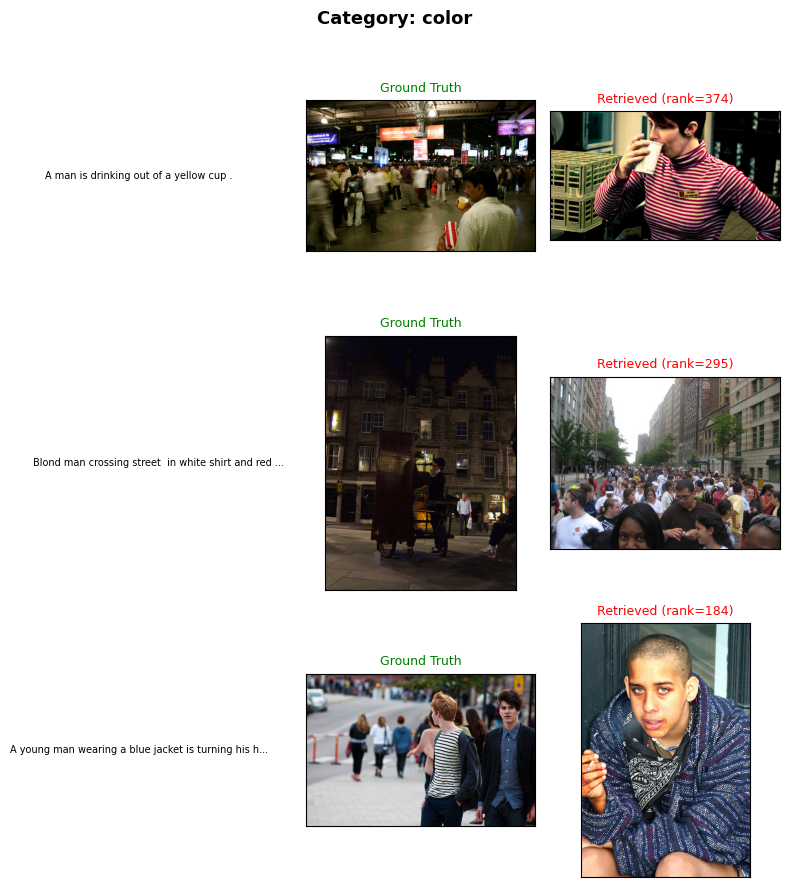


--- Category: action (288 failures) ---
  rank= 110  'A man wearing sunglasses is riding a scooter .'
  rank=  99  'A boy riding his scooter with sunglasses on .'
  rank=  87  'A man jumping onto a platform .'


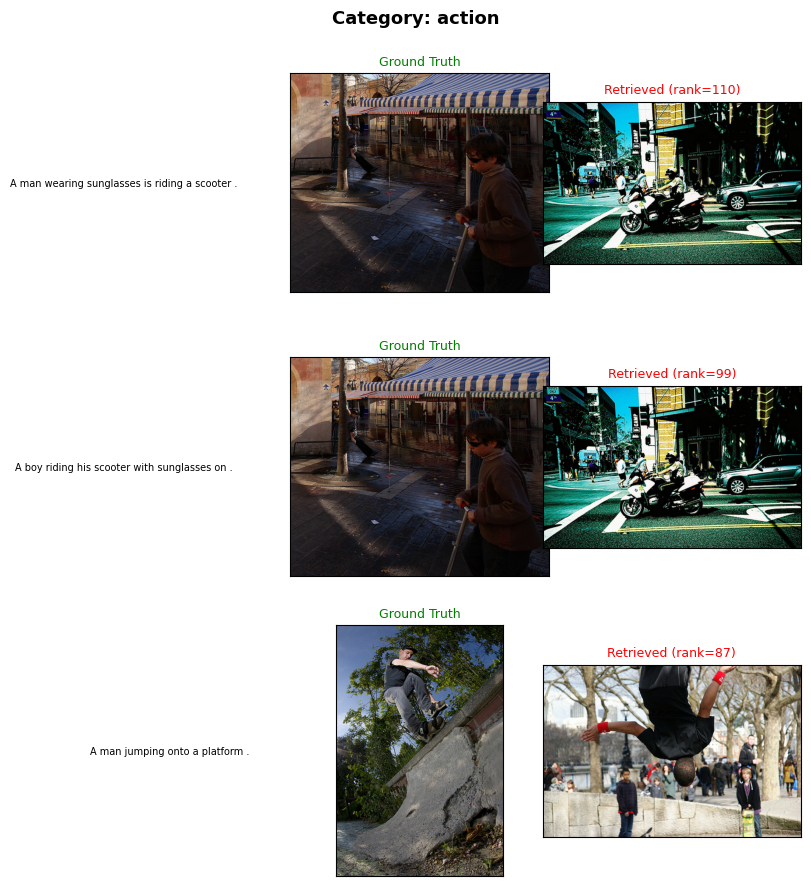

In [14]:
# Show 3 examples from each of the top 4 categories
top_categories = [c for c, _ in category_counts.most_common(4)]

for cat in top_categories:
    cat_cases = [c for c in failure_cases if c["category"] == cat]
    # Sort by rank descending to show worst failures
    cat_cases_sorted = sorted(cat_cases, key=lambda x: x["gt_rank"], reverse=True)
    examples = cat_cases_sorted[:3]

    print(f"\n--- Category: {cat} ({len(cat_cases)} failures) ---")
    for ex in examples:
        print(f"  rank={ex['gt_rank']:>4d}  '{ex['query_text'][:70]}...'" if len(ex["query_text"]) > 70
              else f"  rank={ex['gt_rank']:>4d}  '{ex['query_text']}'")

    fig = plot_error_analysis_grid(examples, test_ds, n_cols=2, n_rows=3)
    fig.suptitle(f"Category: {cat}", fontsize=13, fontweight="bold")
    plt.show()

## 8. Cross-model failure comparison (B/32 vs B/16)

In [15]:
b32_fail = ranks_b32 > 0
b16_fail = ranks_b16 > 0

b32_only = b32_fail & ~b16_fail  # B/32 fails, B/16 succeeds
b16_only = b16_fail & ~b32_fail  # B/16 fails, B/32 succeeds
shared_fail = b32_fail & b16_fail  # both fail
both_ok = ~b32_fail & ~b16_fail  # both succeed

print(f"B/32 only failures: {b32_only.sum():5d} ({b32_only.sum() / n_total * 100:.1f}%)")
print(f"B/16 only failures: {b16_only.sum():5d} ({b16_only.sum() / n_total * 100:.1f}%)")
print(f"Shared failures:    {shared_fail.sum():5d} ({shared_fail.sum() / n_total * 100:.1f}%)")
print(f"Both succeed:       {both_ok.sum():5d} ({both_ok.sum() / n_total * 100:.1f}%)")

B/32 only failures:   626 (12.5%)
B/16 only failures:   452 (9.0%)
Shared failures:     1445 (28.9%)
Both succeed:        2477 (49.5%)


B/32-only failures (B/16 gets these right):
  rank=  16  'The person in the striped shirt is mountain climbing .'
  rank=   7  'Employee in pink shirt smiles for camera inside a restaurant kitchen .'


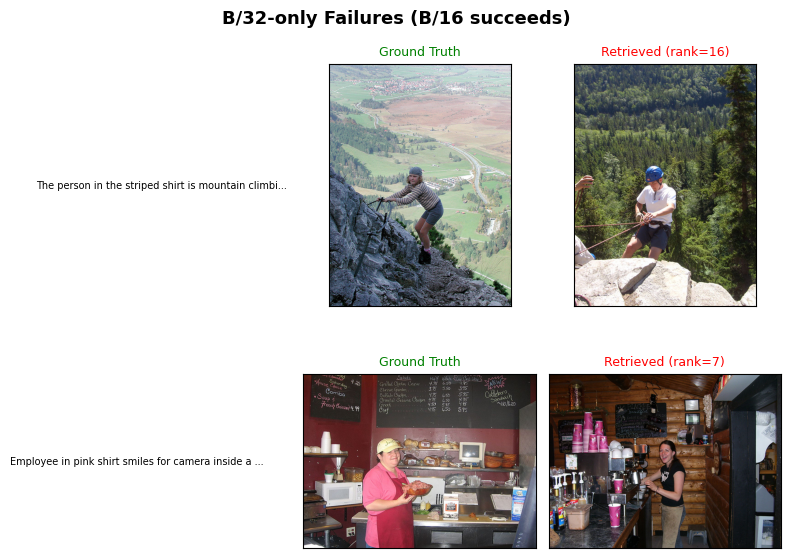

In [16]:
# Examples of B/32-only failures
b32_only_idx = np.where(b32_only)[0]
b32_only_cases = []
for i in b32_only_idx[:20]:  # search within first 20 for interesting ones
    top1 = text_to_image_search(txt_emb_b32[i], img_emb_b32, top_k=1)
    b32_only_cases.append({
        "query_idx": int(i),
        "query_text": captions[i],
        "gt_idx": int(gt_indices[i]),
        "gt_rank": int(ranks_b32[i]),
        "retrieved_idx": int(top1[0][0]),
    })

# Sort by rank desc, take top 2
b32_only_cases.sort(key=lambda x: x["gt_rank"], reverse=True)
b32_only_show = b32_only_cases[:2]

print("B/32-only failures (B/16 gets these right):")
for c in b32_only_show:
    print(f"  rank={c['gt_rank']:>4d}  '{c['query_text'][:80]}'")

if len(b32_only_show) > 0:
    fig = plot_error_analysis_grid(b32_only_show, test_ds, n_cols=2, n_rows=len(b32_only_show))
    fig.suptitle("B/32-only Failures (B/16 succeeds)", fontsize=13, fontweight="bold")
    plt.show()

B/16-only failures (B/32 gets these right):
  rank=  30  'A man in a military-type uniform is standing in the street listening to another '
  rank=  13  'A man in dressy clothes instructed a captain near a large truck .'


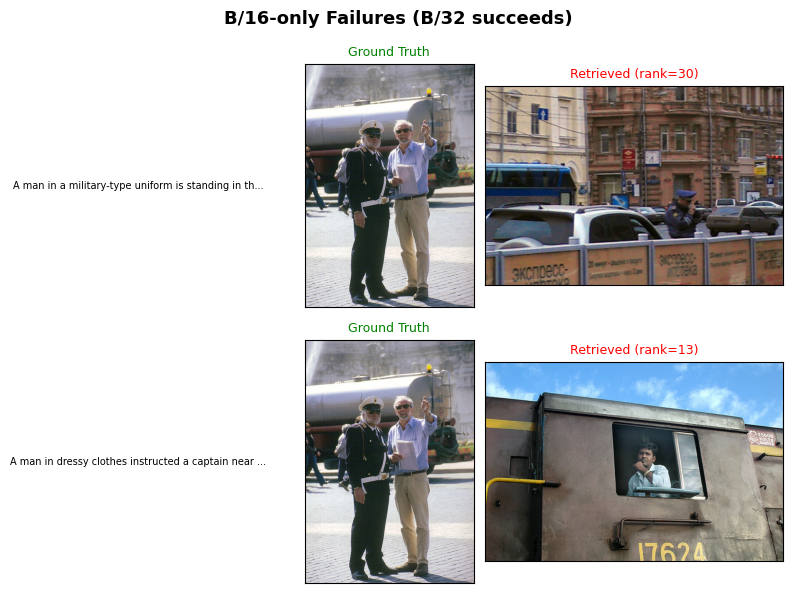

In [17]:
# Examples of B/16-only failures
b16_only_idx = np.where(b16_only)[0]
b16_only_cases = []
for i in b16_only_idx[:20]:
    top1 = text_to_image_search(txt_emb_b16[i], img_emb_b16, top_k=1)
    b16_only_cases.append({
        "query_idx": int(i),
        "query_text": captions[i],
        "gt_idx": int(gt_indices[i]),
        "gt_rank": int(ranks_b16[i]),
        "retrieved_idx": int(top1[0][0]),
    })

b16_only_cases.sort(key=lambda x: x["gt_rank"], reverse=True)
b16_only_show = b16_only_cases[:2]

print("B/16-only failures (B/32 gets these right):")
for c in b16_only_show:
    print(f"  rank={c['gt_rank']:>4d}  '{c['query_text'][:80]}'")

if len(b16_only_show) > 0:
    fig = plot_error_analysis_grid(b16_only_show, test_ds, n_cols=2, n_rows=len(b16_only_show))
    fig.suptitle("B/16-only Failures (B/32 succeeds)", fontsize=13, fontweight="bold")
    plt.show()

## 9. Hardness — caption length & similarity gap

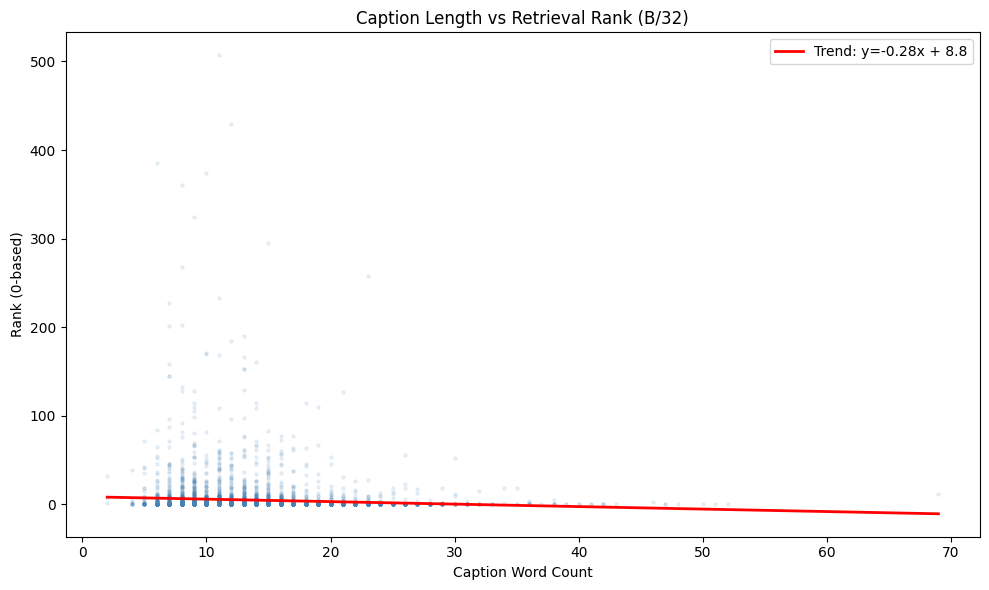

Pearson correlation (word count vs rank): -0.0701


In [18]:
# Caption length vs rank
word_counts = np.array([len(cap.split()) for cap in captions])

fig, ax = plt.subplots(figsize=(10, 6))
ax.scatter(word_counts, ranks_b32, alpha=0.1, s=5, color="steelblue")

# Trend line
z = np.polyfit(word_counts, ranks_b32, 1)
p = np.poly1d(z)
x_line = np.linspace(word_counts.min(), word_counts.max(), 100)
ax.plot(x_line, p(x_line), color="red", linewidth=2, label=f"Trend: y={z[0]:.2f}x + {z[1]:.1f}")

ax.set_xlabel("Caption Word Count")
ax.set_ylabel("Rank (0-based)")
ax.set_title("Caption Length vs Retrieval Rank (B/32)")
ax.legend()
fig.tight_layout()
plt.show()

# Correlation
corr = np.corrcoef(word_counts, ranks_b32)[0, 1]
print(f"Pearson correlation (word count vs rank): {corr:.4f}")

In [19]:
# Mean rank by caption length bucket
short_mask = word_counts < 8
medium_mask = (word_counts >= 8) & (word_counts <= 15)
long_mask = word_counts > 15

buckets = [
    ("Short (<8 words)", short_mask),
    ("Medium (8-15 words)", medium_mask),
    ("Long (>15 words)", long_mask),
]

print(f"{'Bucket':<22} {'Count':>7} {'Mean Rank':>10} {'Median Rank':>12} {'R@1':>8}")
print("-" * 62)
for name, mask in buckets:
    bucket_ranks = ranks_b32[mask]
    r1 = (bucket_ranks == 0).mean() * 100
    print(f"{name:<22} {mask.sum():>7d} {bucket_ranks.mean():>10.1f} {np.median(bucket_ranks):>12.1f} {r1:>7.1f}%")

Bucket                   Count  Mean Rank  Median Rank      R@1
--------------------------------------------------------------
Short (<8 words)           403        9.1          1.0    48.6%
Medium (8-15 words)       3310        5.4          0.0    57.4%
Long (>15 words)          1287        3.0          0.0    64.8%


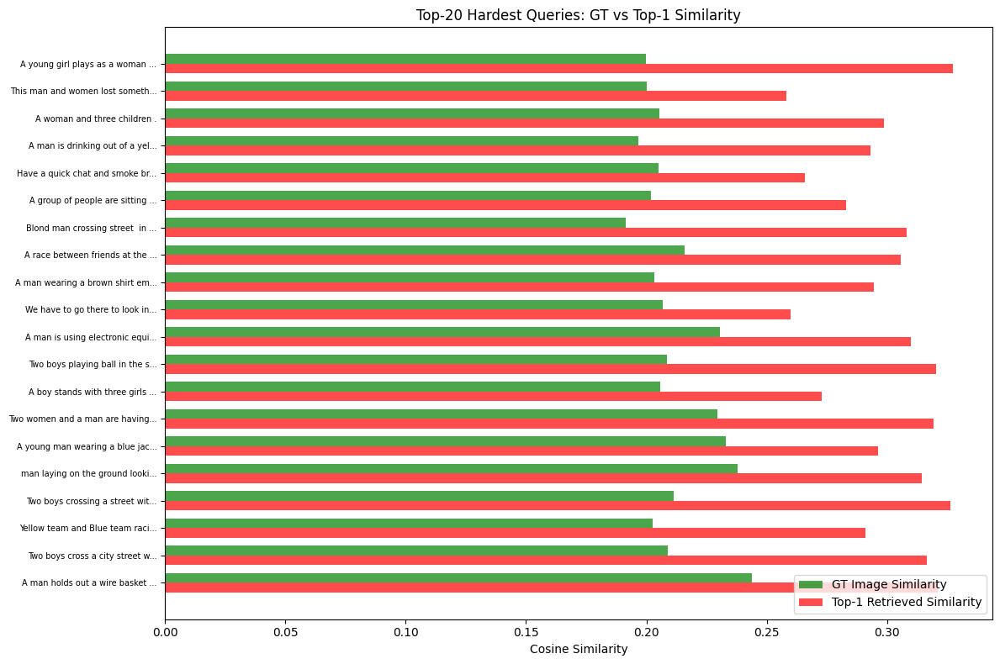

Mean similarity gap (top1 - GT): 0.0872
Max similarity gap: 0.1275
Min similarity gap: 0.0530


In [20]:
# Top-20 hardest queries (highest rank)
hardest_idx = np.argsort(ranks_b32)[::-1][:20]

# Compute similarity matrix for these queries
sim_matrix = get_similarity_scores(txt_emb_b32, img_emb_b32)

gt_sims = []
top1_sims = []
query_labels = []

for idx in hardest_idx:
    gt_sim = float(sim_matrix[idx, gt_indices[idx]])
    top1_img_idx = np.argmax(sim_matrix[idx])
    top1_sim = float(sim_matrix[idx, top1_img_idx])

    gt_sims.append(gt_sim)
    top1_sims.append(top1_sim)
    label = captions[idx][:30] + ("..." if len(captions[idx]) > 30 else "")
    query_labels.append(label)

# Bar chart comparison
fig, ax = plt.subplots(figsize=(12, 8))
y_pos = np.arange(len(hardest_idx))
bar_height = 0.35

ax.barh(y_pos - bar_height / 2, gt_sims, bar_height, label="GT Image Similarity", color="green", alpha=0.7)
ax.barh(y_pos + bar_height / 2, top1_sims, bar_height, label="Top-1 Retrieved Similarity", color="red", alpha=0.7)

ax.set_yticks(y_pos)
ax.set_yticklabels(query_labels, fontsize=7)
ax.set_xlabel("Cosine Similarity")
ax.set_title("Top-20 Hardest Queries: GT vs Top-1 Similarity")
ax.legend(loc="lower right")
ax.invert_yaxis()
fig.tight_layout()
plt.show()

# How close are they?
sim_gaps = np.array(top1_sims) - np.array(gt_sims)
print(f"Mean similarity gap (top1 - GT): {sim_gaps.mean():.4f}")
print(f"Max similarity gap: {sim_gaps.max():.4f}")
print(f"Min similarity gap: {sim_gaps.min():.4f}")

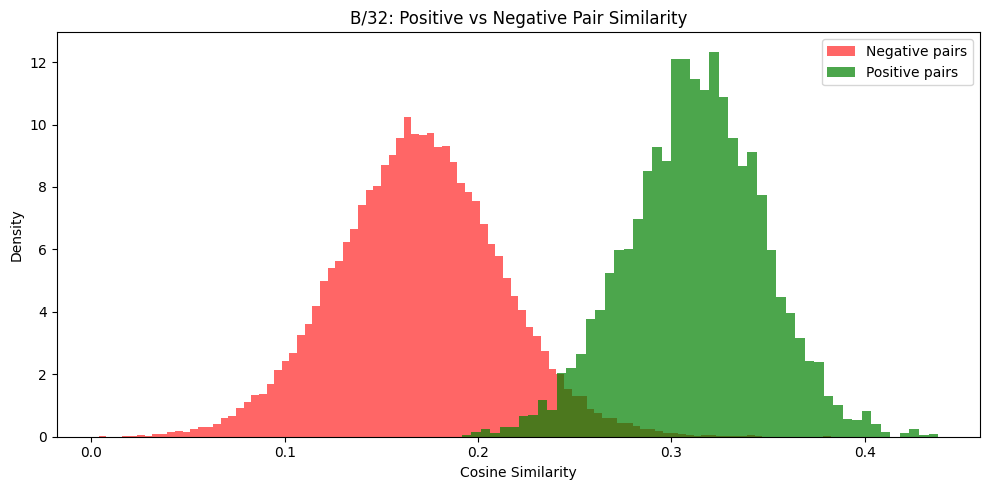

In [21]:
# Full positive vs negative similarity distribution
fig = plot_text_image_similarity_distribution(
    txt_emb_b32, img_emb_b32, gt_indices,
    title="B/32: Positive vs Negative Pair Similarity"
)
plt.show()

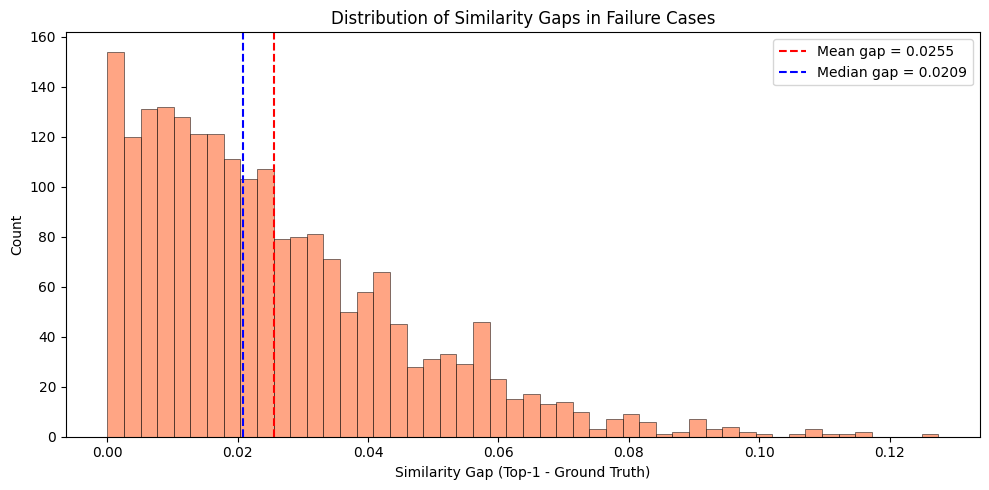

Failures with similarity gap < 0.05: 1805 (87.2%)
These are 'near misses' where fine-tuning could flip the ranking.


In [22]:
# Analyze near-miss similarity gaps for all failures
failure_gt_sims = []
failure_top1_sims = []

for case in failure_cases:
    i = case["query_idx"]
    gt_sim = float(sim_matrix[i, case["gt_idx"]])
    top1_sim = float(sim_matrix[i, case["retrieved_idx"]])
    failure_gt_sims.append(gt_sim)
    failure_top1_sims.append(top1_sim)

failure_gt_sims = np.array(failure_gt_sims)
failure_top1_sims = np.array(failure_top1_sims)
gaps = failure_top1_sims - failure_gt_sims

fig, ax = plt.subplots(figsize=(10, 5))
ax.hist(gaps, bins=50, alpha=0.7, edgecolor="black", linewidth=0.5, color="coral")
ax.axvline(np.mean(gaps), color="red", linestyle="--", label=f"Mean gap = {np.mean(gaps):.4f}")
ax.axvline(np.median(gaps), color="blue", linestyle="--", label=f"Median gap = {np.median(gaps):.4f}")
ax.set_xlabel("Similarity Gap (Top-1 - Ground Truth)")
ax.set_ylabel("Count")
ax.set_title("Distribution of Similarity Gaps in Failure Cases")
ax.legend()
fig.tight_layout()
plt.show()

# How many near-misses have very small gaps?
small_gap = (gaps < 0.05).sum()
print(f"Failures with similarity gap < 0.05: {small_gap} ({small_gap / len(gaps) * 100:.1f}%)")
print("These are 'near misses' where fine-tuning could flip the ranking.")

## 10. Summary* Zero-shot CLIP ViT-B/16 beats B/32 by a few R@1 points; both leave ~40 % of captions misranked.* Counting / colour / spatial captions dominate the failure tail.* Near-miss failures (similarity gap < 0.05) are the natural target for fine-tuning — addressed in notebook 03.